In [1]:
import os
import re
import numpy as np
from skimage import transform
import cv2
from matplotlib import pyplot as plt
from typing import Callable, Optional

plt.set_cmap("gray")
plt.rcParams["figure.figsize"] = [10, 7]
folderCan = "../imgs/can/"
pathsCan = [
    os.path.join(folderCan, re.fullmatch("frame\d\d\.jpg", p).string)
    for p in os.listdir(folderCan)
    if re.fullmatch("frame\d\d\.jpg", p)
]
folderMan = "../imgs/Man/"
pathsMan = [
    os.path.join(folderMan, re.fullmatch("\d\d\d\d\.jpg", p).string)
    for p in os.listdir(folderMan)
    if re.fullmatch("\d\d\d\d\.jpg", p)
]


<Figure size 640x480 with 0 Axes>

In [2]:
def drawVectorFlow(
    img: np.ndarray,
    keypoints: np.ndarray,
    flowVectors: np.ndarray,
    size: int = 2,
    scaleFactor: int = 5,
) -> np.ndarray:
    """
    Draws optical vector flow over image.

    Parameters
    ----------
    img : np.ndarray
        Input image.
    keypoints : np.ndarray
        Keypoints.
    flowVectors : np.ndarray
        Optical vector flow.
    size : int, optional
        Size of line, by default 2
    scaleFactor : int, optional
        Scaling factor of optical vector, by default 5

    Returns
    -------
    np.ndarray
        Output image.
    """
    img = img.copy()
    A = [(int(round(x)), int(round(y))) for (x, y) in keypoints]
    B = [
        (int(round(x)), int(round(y)))
        for (x, y) in keypoints + scaleFactor * flowVectors
    ]
    for (x1, y1), (x2, y2) in zip(A, B):
        img = cv2.arrowedLine(
            img, (x1, y1), (x2, y2), (0, 255, 0), size, cv2.LINE_AA, 0, 0.2
        )
    return img


def drawKeypoints(
    img: np.ndarray, keypoints: np.ndarray, size: int = 3
) -> np.ndarray:
    """
    Draws keypoints over input image.

    Parameters
    ----------
    img : np.ndarray
        Input image
    keypoints : np.ndarray
        Keypoint.
    size : int, optional
        Size of dots, by default 3

    Returns
    -------
    np.ndarray
        Output image.
    """
    img = img.copy()
    keypoints = [(int(round(x)), int(round(y))) for (x, y) in keypoints.copy()]
    for point in keypoints:
        img = cv2.circle(img, point, size, (255, 0, 0), -1)
    return img


def createWindow(x: float, y: float, window_size: int) -> tuple[slice, slice]:
    """
    Creates window (tuple of slices) size of window_size over the input coordinates x,y.

    Parameters
    ----------
    x : float
        X coordinate.
    y : float
        Y coordinate.
    window_size : int
        Size of window.

    Returns
    -------
    tuple[slice,slice]
        Output tuple of slices.
    """
    x = int(round(x))
    y = int(round(y))
    win_half_size = window_size // 2
    return tuple(
        [
            slice(
                y - win_half_size,
                y + win_half_size + (1 if window_size % 2 == 1 else 0),
            ),
            slice(
                x - win_half_size,
                x + win_half_size + (1 if window_size % 2 == 1 else 0),
            ),
        ]
    )


## Zadatak 1
U  okviru  ovog  zadatka  potrebno  je  implementirati  funkciju  kojom  se  realizuje  Lucas-Kanade 
estimacija optičkog toka. Optički tok je prividan pomeraj objekata, površina i ivica, prouzrokovan relativnim pomerajem tih objekata na sceni. Ovaj problem se obično rešava pomoću dve slike koje su temporalno sukcesivne, prikazuju trenutak za trenutkom. Za ovu implementaciju koja je predmet zadatka podrazumeva se da je "sparse", to jest, uzimaju se u obzir samo ključne (kvalitetne) tačke, umesto svih tačaka na slici ("dense"). Za ključne tačke na prvoj slici, traže se njihove odgovarajuće pozicije na drugoj, samim tim pomeraj tih ključnih tačaka za tu razliku u vremenu. Za računanje ključnih tačaka u ovoj implementaciji, korišćena je funkcija goodFeaturesToTrack, iz open-cv biblioteke. Pretpostavke samog algoritma su konstantnost osvetljaja (osvetljenje ključnih tačaka je identično nakon pomeraja) i konstantnost pomeraja (pomeraj je konstntan na loklanom nivo). Osnovna implementacija prvog zadatka se može podeliti na nekoliko koraka koji važe za svaku ključnu tačku: 
1. Uzimanje lokalnih piksela veličine winSize prozora
1. Prostorni gradijent prozora po x i y osi (za prvu sliku)
1. Vremenski gradijent (razlika prozora prve i druge slike)
1. Pakovanje prozora u sistem linearnih jednačina 
1. Rešavanje tog sistema linearnih jednačina
1. Provera validnosti pomeraja: da li je pomeraj izvan prozora i da li je prevelika razlika u osvetljenju za estimiran pomeraj
<br><br/>


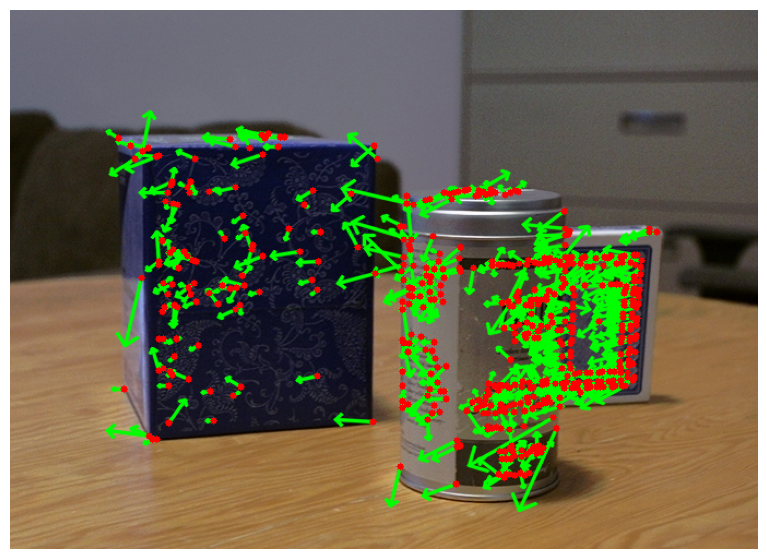

In [3]:
def lucasKanade(
    img1: np.ndarray,
    img2: np.ndarray,
    keypoints: np.ndarray,
    winSize: int,
    errThr: Optional[float] = 0,
) -> tuple[np.ndarray, np.ndarray]:
    """
    Simple Lucas Kanade implementation.

    Parameters
    ----------
    img1 : np.ndarray
        Current image.
    img2 : np.ndarray
        Next frame of image.
    keypoints : np.ndarray
        Keypoint.
    winSize : int
        Size of window.
    errThr : Optional[float], optional
        Error threshold, by default 0

    Returns
    -------
    tuple[np.ndarray,np.ndarray]
        Returns tuple of optical vector flow and valid keypoints.

    Raises
    ------
    ValueError
        Input img1 and img2 have different shapes.
    TypeError
        Input img1 is not np.uin8 dtype.
    TypeError
        Input img2 is not np.uin8 dtype.
    """
    if img1.shape != img2.shape:
        raise ValueError(
            "Mismatched shapes, expected same shape for img1 and img2!"
        )
    if img1.dtype != np.uint8:
        raise TypeError(f"For input img1 expected type np.uint8, got {img1.dtype}")
    img1 = img1 / 255
    if img2.dtype != np.uint8:
        raise TypeError(f"For input img2 expected type np.uint8, got {img2.dtype}")
    img2 = img2 / 255

    flowVectors = np.zeros_like(keypoints, dtype=np.float64)
    validPoints = np.ones(len(keypoints), dtype=bool)

    # Calculate spatial gradient of img1
    Iy, Ix = np.gradient(img1)

    for i, (xOld, yOld) in enumerate(keypoints):
        # Define the search window around the keypoint
        winIndex = createWindow(xOld, yOld, winSize)
        win1 = img1[winIndex]
        win2 = img2[winIndex]

        # Compute A and b matrices for least squares solution
        winIx = Ix[winIndex]
        winIy = Iy[winIndex]
        winIt = win2 - win1
        A = np.c_[winIx.ravel(), winIy.ravel()]
        b = -winIt.ravel()

        # Solve least squares problem to get flow vector
        flowVectors[i] = np.linalg.lstsq(A, b, rcond=None)[0]
        u, v = flowVectors[i]
        # Calculate temporal gradient between img1 and img2
        xNew = xOld + u
        yNew = yOld + v

        winOld3 = createWindow(xOld, yOld, 3)
        winNew3 = createWindow(xNew, yNew, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition / oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition / newPosition.sum()
        # Check if optical vector flow is out of window scope
        if np.abs(u) > winSize / 2 or np.abs(v) > winSize / 2:
            validPoints[i] = False
        # Check if there is a large difference in brightness
        if np.mean((oldPosition - newPosition) ** 2) > errThr:
            validPoints[i] = False
    return flowVectors, validPoints


# Optical flow parameters
winSize = 5
# Load images
canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE)
canImg2 = cv2.imread(pathsCan[1], cv2.IMREAD_GRAYSCALE)
# Optical flow estimation
keypoints = cv2.goodFeaturesToTrack(
    canImg1, maxCorners=canImg1.size, qualityLevel=0.1, minDistance=3
)
keypoints = np.squeeze(keypoints).astype(np.int64)
flowVectors, validPoints = lucasKanade(canImg1, canImg2, keypoints, winSize)
# Draw keypoints and scaled optical vector flow
imgRGB = cv2.cvtColor(cv2.imread(pathsCan[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
imgRGB = drawVectorFlow(imgRGB, keypoints, flowVectors, scaleFactor=20)
imgRGB = drawKeypoints(imgRGB, keypoints)
plt.figure()
plt.imshow(imgRGB)
plt.axis("off");


Na gornjoj slici su prikazane ključne tačke i njihov pomeraj za prva dva frejma konzerve. Zbog preglednosti pomeraj je izdužen 20 puta više od estimirane vrednosti. Može se primetiti da ugao pomeraja nije usklađen (nije većinski u levo) i dužina pomeraja varira u zavisnosti od toga na kom objektu su ključne tačke - kutija, konzerva i kutija karata. Najveći pomeraji iz frejma u frejm su na konzervi, zatim kutiji, pa kutiji za karte, jer su objekti tim redosledom udaljeni u odnosu na posmatrača. Očekivano je da ova osnovna implementacija LK algoritma najbolje funkcioniše na kutiji karata, zbog najmanjih pomeraja.

In [4]:
def runOpticalFlowFolder(
    folderName: str, pathsCan: list[str], opticalFlowFunction: Callable, **kwargs
) -> None:
    """
    Run opticalFlowFunction function on pathCan files and save in folderName folder.

    Parameters
    ----------
    folderName : str
        Name of folder.
    pathsCan : :list[str]
        List of image paths.
    opticalFlowFunction : Callable
        Optical flow estimation function.
    """
    os.makedirs(folderName, exist_ok=True)
    canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE)
    keypoints = cv2.goodFeaturesToTrack(
        canImg1, maxCorners=canImg1.size, qualityLevel=0.1, minDistance=3
    )
    keypoints = np.squeeze(keypoints).astype(np.int64)
    for currentPath, nextPath in zip(pathsCan[:-1], pathsCan[1:]):
        savePath = os.path.join(folderName, os.path.basename(currentPath))
        currentFrame = int(os.path.basename(currentPath)[5:7])
        canImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
        flowVectors, validPoints = opticalFlowFunction(
            canImg1, canImg2, keypoints, **kwargs
        )
        keypointImgRGB = cv2.cvtColor(
            cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB
        )
        keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
        cv2.imwrite(savePath, cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
        if currentFrame in [1, 5, 9]:
            plt.figure()
            plt.imshow(keypointImgRGB)
            plt.axis("off")
            plt.title(f"Frame: {currentFrame}")
        canImg1 = canImg2
        keypointImgRGB = cv2.cvtColor(
            cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB
        )
        keypoints = np.round(
            keypoints[validPoints] + flowVectors[validPoints]
        ).astype(np.int64)
    # Save the last frame keypoints to disk
    currentFrame = int(os.path.basename(pathsCan[-1])[5:7])
    savePath = os.path.join(folderName, os.path.basename(pathsCan[-1]))
    keypointImgRGB = cv2.cvtColor(
        cv2.imread(pathsCan[-1], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB
    )
    keypointImgRGB = drawKeypoints(keypointImgRGB, keypoints)
    cv2.imwrite(savePath, cv2.cvtColor(keypointImgRGB, cv2.COLOR_RGB2BGR))
    plt.figure()
    plt.imshow(keypointImgRGB)
    plt.axis("off")
    plt.title(f"Frame: {currentFrame}")


Napisana je funkcija ```runOpticalFlowFolder```, koja prolazi kroz sve slike u folderu Can i izvršava estimaciju optičkog toka za proizvoljnu funkciju ```opticalFlowFunction ``` i neophodne argumente. Biće korišćena za sve varijante LK algoritma. 
 

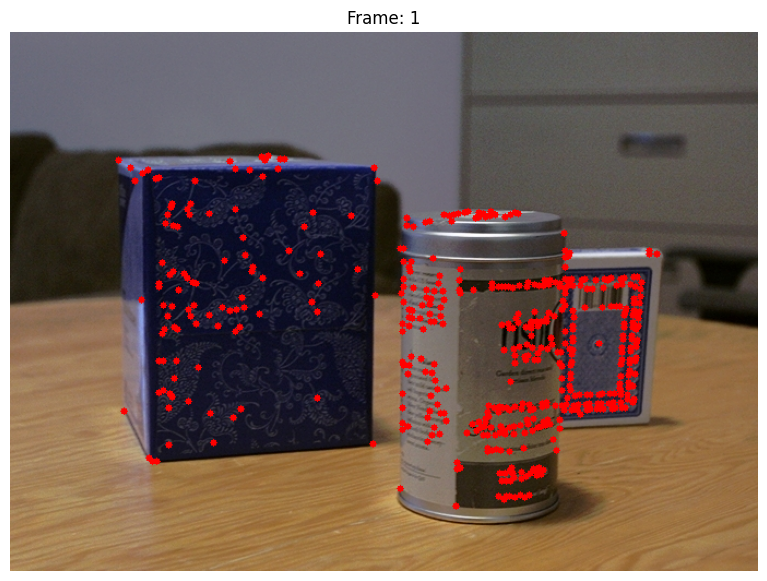

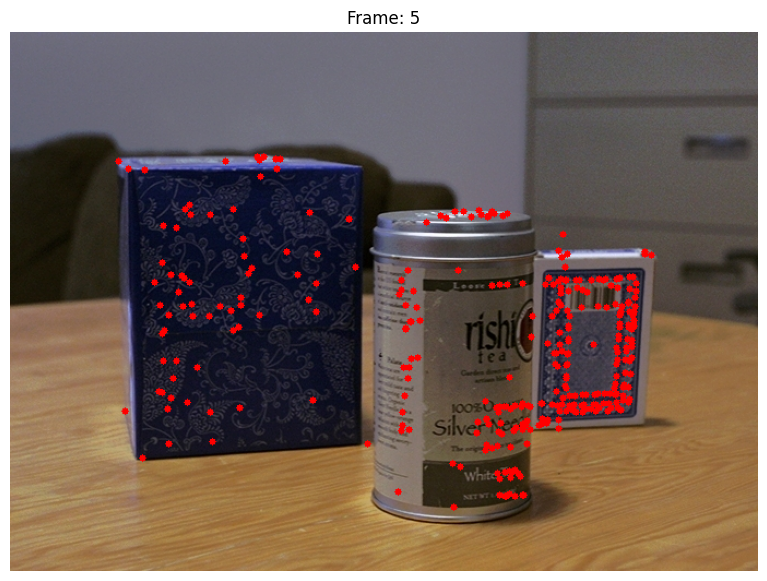

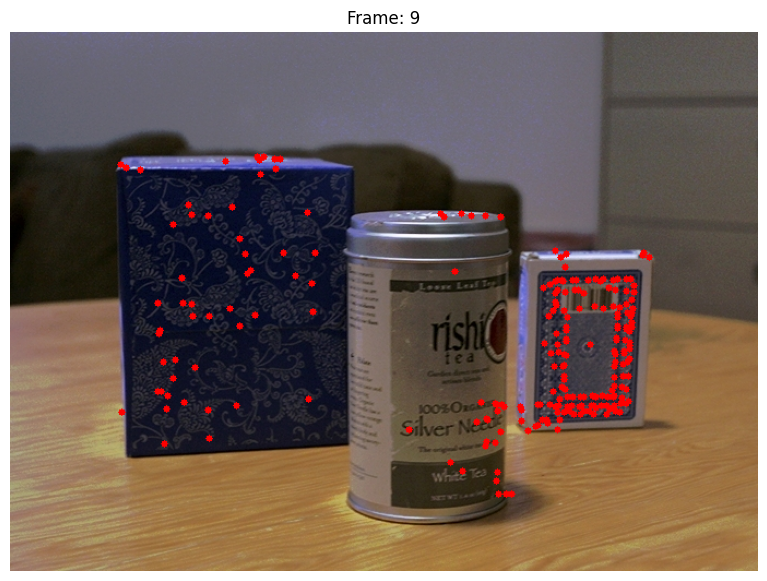

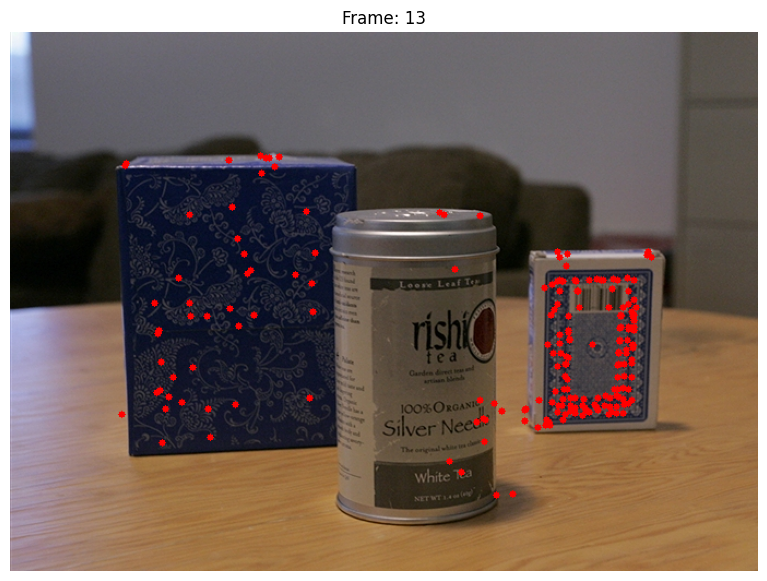

In [5]:
folderName = "CanLK/"
winSize = 5
errThr = 2e-3
runOpticalFlowFolder(
    folderName, pathsCan, lucasKanade, winSize=winSize, errThr=errThr
)


Eksperimentalno je određeno da granica za odbacivanje pomeraja bude 1e-3. Za manje vrednosti veoma brzo se smanjuje broj ključnih tačaka iz frejma u frejm, a za veće vrednosti ostaje znatno veći broj ključnih tačaka koje su očigledno na neodgovarajućem mestu. Kao što se moglo očekivati, algoritam se dobro ponaša na ključnim tačkama koje se nalaze na kutiji karata, pored toga neke ključne tačke su dobro ispraćene na kutiji, većinski nisu, a na samoj konzervi algoritam uopšte nije bio uspešan.  

## Zadatak 2
U ovom zadatku je potrebno poboljšati originalnu implementaciju LK algoritma. Ideja je da se za svaku ključnu tačku više puta ponavlja originalna implementacija i da se u svakoj iteraciji poboljšaju estimirani pomeraji. Ključna stvar jeste da sa svakom novom iteracijom pomera se centar prozora za estimirani pomeraj u tom trenutku u drugoj slici koji se dalje koristi za estimaciju vremenskog gradijenta. 
Ostatak je identičan. 
<br><br/>

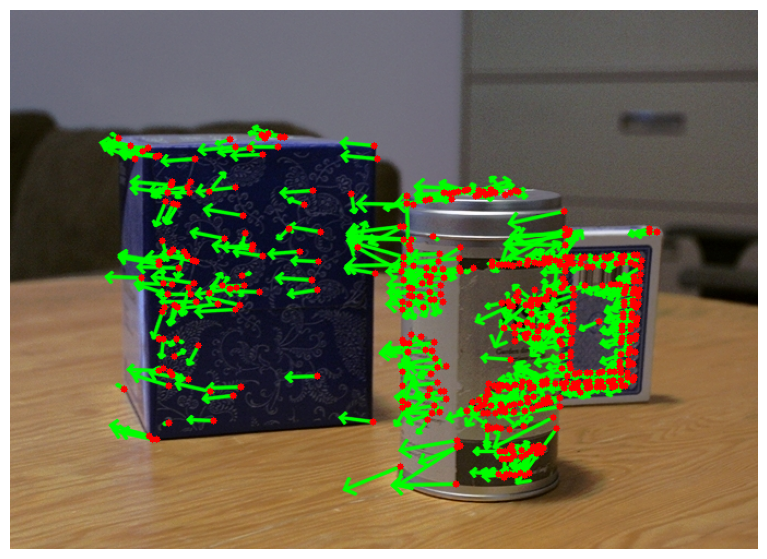

In [6]:
def lucasKanadeIter(
    img1: np.ndarray,
    img2: np.ndarray,
    keypoints: np.ndarray,
    winSize: int,
    numIter: int,
    initFlow: Optional[np.ndarray] = None,
    errThr: Optional[float] = 0,
) -> tuple[np.ndarray, np.ndarray]:
    """
    Iterative Lucas Kanade implementation.

    Parameters
    ----------
    img1 : np.ndarray
        Current image.
    img2 : np.ndarray
        Next frame of image.
    keypoints : np.ndarray
        Keypoint.
    winSize : int
        Size of window.
    numIter : int
        Number of iterations.
    initFlow : Optional[np.ndarray], optional
        Initial estimation of optical flow, by default None
    errThr : Optional[float], optional
        Error threshold, by default 0

    Returns
    -------
    tuple[np.ndarray,np.ndarray]
        Returns tuple of optical vector flow and valid keypoints.

    Raises
    ------
    ValueError
        Input img1 and img2 have different shapes.
    TypeError
        Input img1 is not np.uin8 dtype.
    TypeError
        Input img2 is not np.uin8 dtype.
    """
    if img1.shape != img2.shape:
        raise ValueError(
            "Mismatched shapes, expected same shape for img1 and img2!"
        )
    if img1.dtype != np.uint8:
        raise TypeError(f"For input img1 expected type np.uint8, got {img1.dtype}")
    img1 = img1 / 255
    if img2.dtype != np.uint8:
        raise TypeError(f"For input img2 expected type np.uint8, got {img2.dtype}")
    img2 = img2 / 255

    if initFlow is None:
        flowVectors = np.zeros_like(keypoints, dtype=np.float64)
    else:
        flowVectors = initFlow.copy()
    validPoints = np.ones(len(keypoints), dtype=bool)

    # Calculate spatial gradient of img1
    Iy, Ix = np.gradient(img1)

    for i, (xOld, yOld) in enumerate(keypoints):
        u, v = flowVectors[i]
        xNew = xOld + u
        yNew = yOld + v
        # Define the search window around the keypoint
        winIndex1 = createWindow(xOld, yOld, winSize)
        win1 = img1[winIndex1]

        winIx = Ix[winIndex1]
        winIy = Iy[winIndex1]
        # Iteratively find better optical flow estimation
        for _ in range(numIter):
            winIndex2 = createWindow(xNew, yNew, winSize)
            win2 = img2[winIndex2]
            # Calculate temporal gradient between img1 and img2
            winIt = win2 - win1
            # Compute A and b matrices for least squares solution
            A = np.c_[winIx.ravel(), winIy.ravel()]
            b = -winIt.ravel()

            # Solve least squares problem to get flow vector
            flowVectors[i] += np.linalg.lstsq(A, b, rcond=None)[0]
            u, v = flowVectors[i]

            xNew = xOld + u
            yNew = yOld + v
            # Check if optical vector flow is out of window scope
            if np.abs(u) > winSize / 2 or np.abs(v) > winSize / 2:
                validPoints[i] = False
                break
        winOld3 = createWindow(xOld, yOld, 3)
        winNew3 = createWindow(xNew, yNew, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition / oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition / newPosition.sum()

        # Check if there is a large difference in brightness
        if np.mean((oldPosition - newPosition) ** 2) > errThr:
            validPoints[i] = False

    return flowVectors, validPoints


# Optical flow parameters
winSize = 9
numIter = 7
initFlow = np.zeros_like(keypoints, dtype=np.float64)
# Load images
canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE)
canImg2 = cv2.imread(pathsCan[1], cv2.IMREAD_GRAYSCALE)
# Optical flow estimation
p0 = cv2.goodFeaturesToTrack(
    canImg1, maxCorners=canImg1.size, qualityLevel=0.1, minDistance=3
)
keypoints = np.squeeze(keypoints).astype(np.int64)
flowVectors, validPoints = lucasKanadeIter(
    canImg1, canImg2, keypoints, winSize, numIter, initFlow
)
# Draw keypoints and scaled optical vector flow
imgRGB = cv2.cvtColor(cv2.imread(pathsCan[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
imgRGB = drawVectorFlow(imgRGB, keypoints, flowVectors, scaleFactor=10)
imgRGB = drawKeypoints(imgRGB, keypoints)
plt.figure()
plt.imshow(imgRGB)
plt.axis("off");

Pomeraji su i ovde zbog preglednosti uvećani 10 puta. Može se videti značajno poboljšanje, pomeraji su većinski orijentisani na levoj strani kao što se očekuje. Otprilike su iste dužine, što je dobro. Najlošije estimacije su na konzervi, i to je najverovatnije zbog temporalnog alijasinga. Efekat koji postoji kada iterativnom metodom pomeraj iskonvergira u lokalni minimum, te dolazi do loše estimacije pomeraja, jer je pravi pomeraj prevelik. 

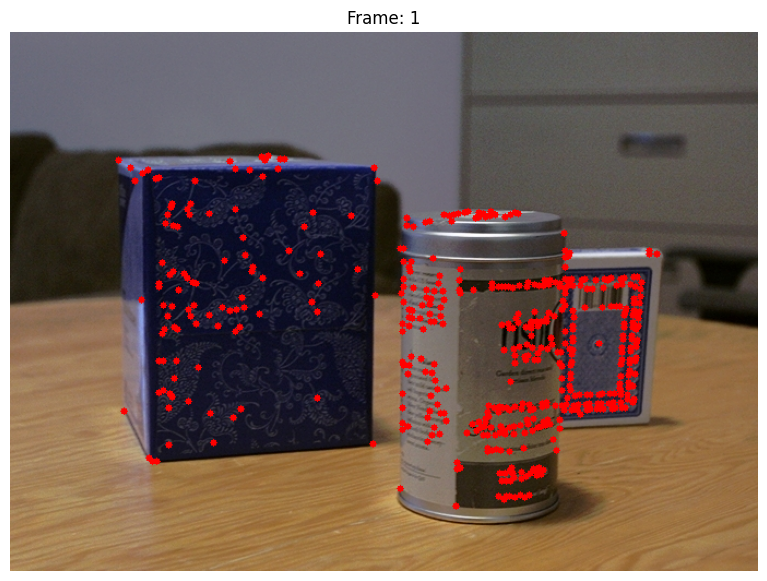

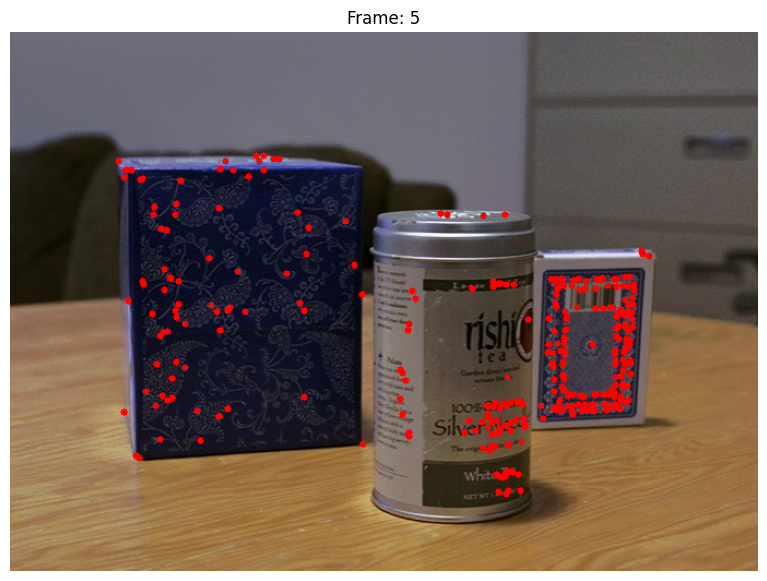

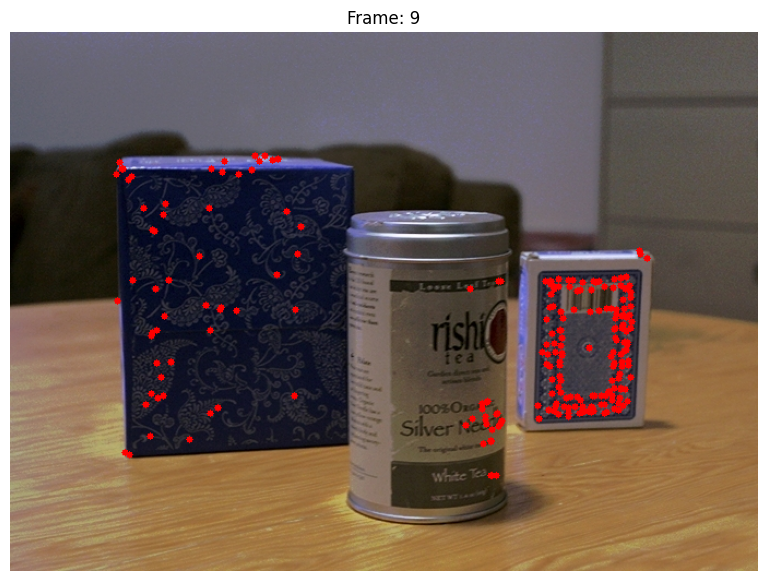

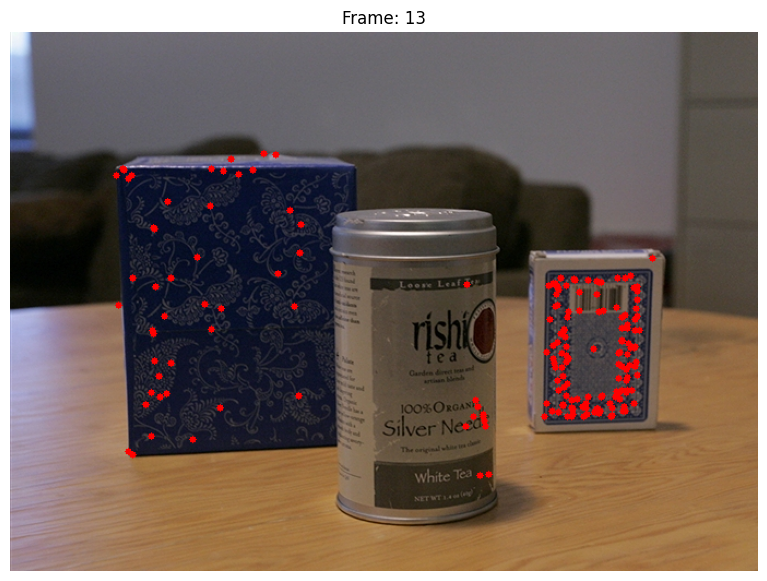

In [7]:
winSize = 9
numIter = 7
folderName = "CanLKiter/"
errThr = 5e-3
runOpticalFlowFolder(
    folderName,
    pathsCan,
    lucasKanadeIter,
    winSize=winSize,
    numIter=numIter,
    errThr=errThr,
)

Sličnom procedurom kao u prethodnoj implementaciji, sada je prag podešen na 5e-3. Kao što smo primetili na prva dva frejma, iterativni LK algoritam dobro se ponaša na kutiji i kutiji karata, a zbog prevelikog pomeraja, ponaša se loše na konzervi.  

## Zadatak 3
Naredno poboljšanje LK algoritma jeste pomoću Gausove piramide. Ideja je da se minimizuje efekat temporalnog alijasinga i poboljša estimacija velikih pomeraja. Gausova piramida predstavlja reprezentaciju slike na različitim skalama. Kako raste skala, originalna slika se filtrira jačim Gausovim filtrom i pododabira radi redukcije dimenzije. Za rešavanje problema estimacije optičkog toka može se iskoristiti tako što se iterativno procenjuje pomeraj od najveće skale (najzamućenija slika) do najniže skale (originalna slika). Na svakom nivou se koristi prethodna iterativna implementacija LK algoritma. 

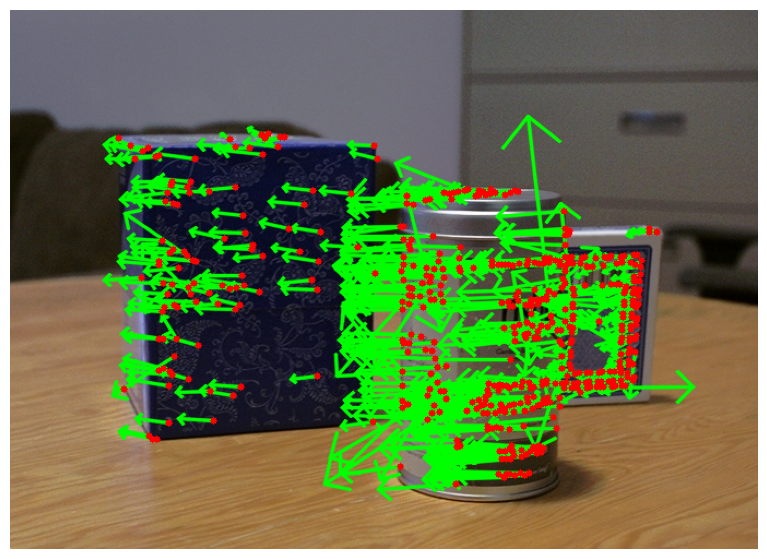

In [8]:
def pyrLucasKanade(
    img1: np.ndarray,
    img2: np.ndarray,
    keypoints: np.ndarray,
    winSize: int,
    numIter: int,
    levelNum: int,
    levelScale: float,
    errThr: Optional[float] = 0,
) -> tuple[np.ndarray, np.ndarray]:
    """
    Pyramid Lucas Kanade implementation.

    Parameters
    ----------
    img1 : np.ndarray
        Current image.
    img2 : np.ndarray
        Next frame of image.
    keypoints : np.ndarray
        Keypoints.
    winSize : int
        Size of window.
    numIter : int
        Number of iterations.
    levelNum : int
        Number of pyramid levels.
    levelScale : float
        Scale reduction per pyramid level.
    errThr : Optional[float], optional
        Error threshold, by default 0

    Returns
    -------
    tuple[np.ndarray,np.ndarray]
        Returns tuple of optical vector flow and valid keypoints.

    Raises
    ------
    ValueError
        Input img1 and img2 have different shapes.
    TypeError
        Input img1 is not np.uin8 dtype.
    TypeError
        Input img2 is not np.uin8 dtype.
    """
    if img1.shape != img2.shape:
        raise ValueError(
            "Mismatched shapes, expected same shape for img1 and img2!"
        )
    if img1.dtype != np.uint8:
        raise TypeError(f"For input img1 expected type np.uint8, got {img1.dtype}")
    img1 = img1 / 255
    if img2.dtype != np.uint8:
        raise TypeError(f"For input img2 expected type np.uint8, got {img2.dtype}")
    img2 = img2 / 255
    flowVectors = np.zeros_like(keypoints, dtype=np.float32)
    validPoints = np.ones(len(keypoints), dtype=bool)

    if levelNum > 0:
        levelNum -= 1
    # Pyramid creation order form most to least blurred
    pyramid1 = list(
        transform.pyramid_gaussian(img1, max_layer=levelNum, downscale=levelScale)
    )[::-1]
    pyramid2 = list(
        transform.pyramid_gaussian(img2, max_layer=levelNum, downscale=levelScale)
    )[::-1]

    prevShape = np.array(pyramid1[0].shape[::-1])
    ratio = np.array(pyramid1[0].shape[::-1]) / np.array(pyramid1[-1].shape[::-1])
    # Scale keypoint to most blurred scale
    keypoints = keypoints * ratio

    for img1, img2 in zip(pyramid1, pyramid2):
        currentShape = np.array(img1.shape[::-1])
        # Calculate spatial gradient of img1
        Iy, Ix = np.gradient(img1)
        # Update optical vector flow and keypoint to new scale
        flowVectors = flowVectors * (currentShape / prevShape)
        keypoints = keypoints * (currentShape / prevShape)
        for i, (xOld, yOld) in enumerate(keypoints):
            if not validPoints[i]:
                continue
            u, v = flowVectors[i]
            xNew = xOld + u
            yNew = yOld + v
            # Define the search window around the keypoint
            winIndex1 = createWindow(xOld, yOld, winSize)
            win1 = img1[winIndex1]

            winIx = Ix[winIndex1]
            winIy = Iy[winIndex1]
            # Iteratively find better optical flow estimation
            for _ in range(numIter):
                winIndex2 = createWindow(xNew, yNew, winSize)
                win2 = img2[winIndex2]
                # Check if windows are close to the border
                if win1.shape != win2.shape:
                    break
                # Calculate temporal gradient between img1 and img2
                winIt = win2 - win1
                # Compute A and b matrices for least squares solution
                A = np.c_[winIx.ravel(), winIy.ravel()]
                b = -winIt.ravel()

                # Solve least squares problem to get flow vector
                flowVectors[i] += np.linalg.lstsq(A, b, rcond=None)[0]
                u, v = flowVectors[i]

                xNew = xOld + u
                yNew = yOld + v
                dist = np.sqrt(u**2 + v**2)
                if dist < 0.1:
                    break
        prevShape = currentShape
    # Check if estimated optical flow is valid
    for i, (xOld, yOld) in enumerate(keypoints):
        u, v = flowVectors[i]
        xNew = xOld + u
        yNew = yOld + v
        # Check if optical vector flow is out of window scope
        if np.abs(u) > ((winSize // 2) / ratio[0]) or np.abs(v) > (
            (winSize // 2) / ratio[1]
        ):
            validPoints[i] = False
        winOld3 = createWindow(xOld, yOld, 3)
        winNew3 = createWindow(xNew, yNew, 3)
        oldPosition = img1[winOld3]
        oldPosition = oldPosition / oldPosition.sum()
        newPosition = img1[winNew3]
        newPosition = newPosition / newPosition.sum()
        # Check if windows are close to the border
        if oldPosition.shape != newPosition.shape:
            validPoints[i] = False
            continue
        # Check if there is a large difference in brightness
        if np.mean((oldPosition - newPosition) ** 2) > errThr:
            validPoints[i] = False

    return flowVectors, validPoints


# Optical flow parameters
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
# Load images
canImg1 = cv2.imread(pathsCan[0], cv2.IMREAD_GRAYSCALE)
canImg2 = cv2.imread(pathsCan[1], cv2.IMREAD_GRAYSCALE)
# Optical flow estimation
p0 = cv2.goodFeaturesToTrack(
    canImg1, maxCorners=canImg1.size, qualityLevel=0.1, minDistance=3
)
keypoints = np.squeeze(p0).astype(np.int64)
initFlow = np.zeros_like(keypoints, dtype=np.float64)
# Draw keypoints and scaled optical vector flow
flowVectors, validPoints = pyrLucasKanade(
    canImg1, canImg2, keypoints, winSize, numIter, levelNum, levelScale
)
imgRGB = cv2.cvtColor(cv2.imread(pathsCan[0], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
imgRGB = drawVectorFlow(imgRGB, keypoints, flowVectors, scaleFactor=10)
imgRGB = drawKeypoints(imgRGB, keypoints)
plt.figure()
plt.imshow(imgRGB)
plt.axis("off");


Pomeraji su i ovde takođe deset puta duži. Kada pogledamo ključne tačke na konzervi, sve su orijentisane uglavnom na jednu stranu i iste su dužine, što je dobar znak. Sada algoriam radi dosta bolje te je ovom implementacijom rešen problem temporalnog alijasinga. Na konzervi je poboljšan deo gde su veliki pomeraji, ali takođe dobro radi i na ostalim objektima na slici, gde su manji pomeraji, čak u nekim delovima i bolje od prethodne implementacije. 

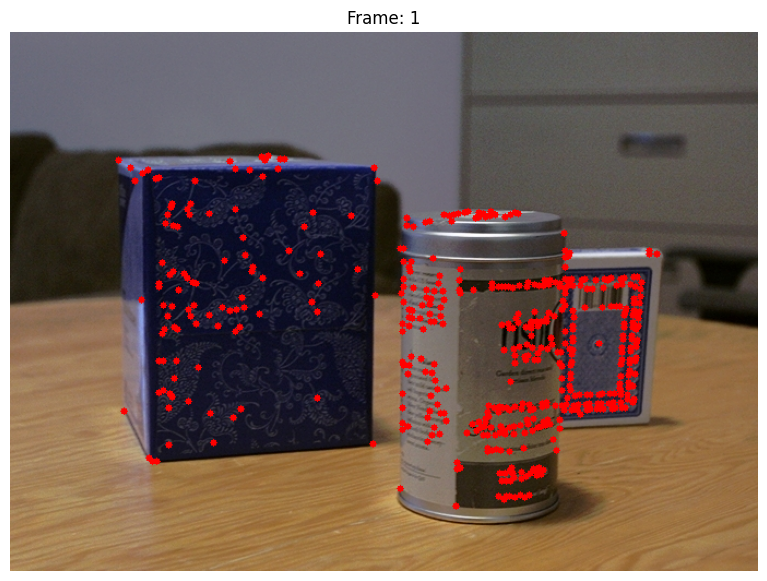

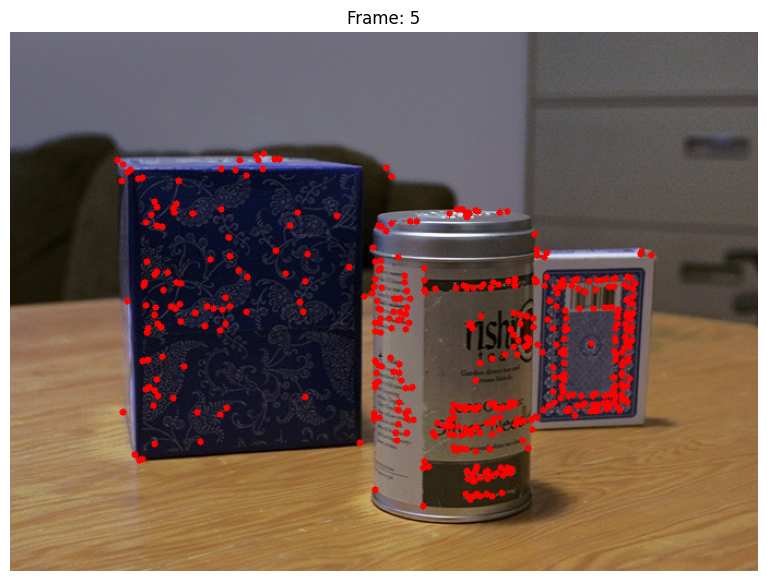

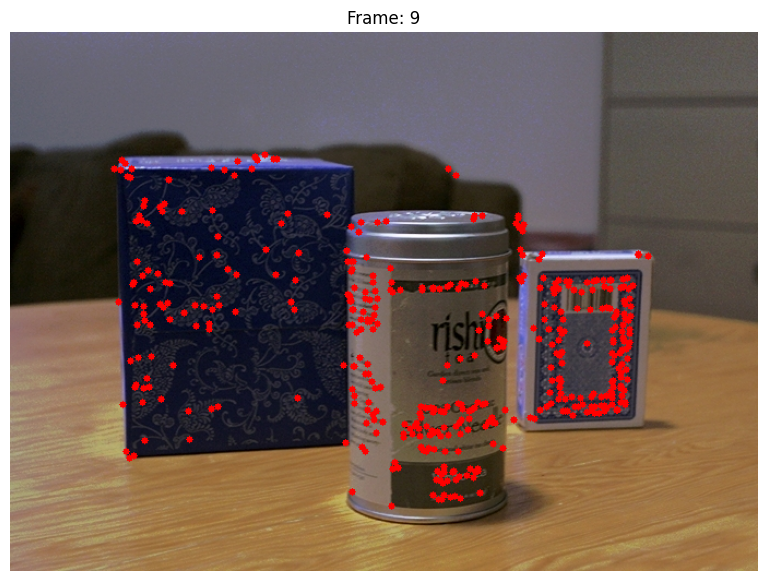

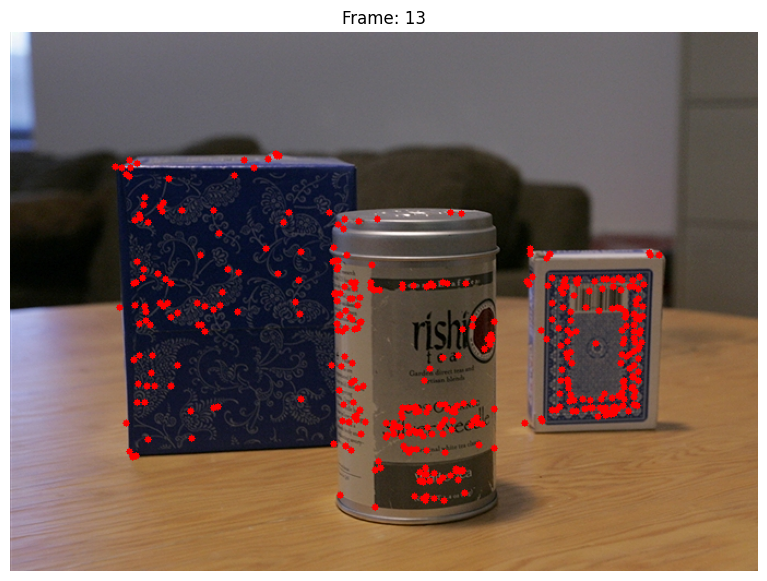

In [9]:
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
errThr = 1e-2
folderName = "CanLKpyr/"
runOpticalFlowFolder(
    folderName,
    pathsCan,
    pyrLucasKanade,
    winSize=winSize,
    numIter=numIter,
    levelNum=levelNum,
    levelScale=levelScale,
    errThr=errThr,
)


Granica je određena istom metodom kao i u prethodna dva slučaja, sada je 1e-2. I u ovom delu algoritam dobro radi, kada pogledamo slike vidimo da ključne tačke ostaju na delu objekta gde i treba da budu. Kao što smo mogli pretpostaviti na osnovu prve dve slike, značajno su poboljšane performanse ključnih tačaka na konzervi. 

## Zadatak 4
U ovom delu je potrebno iskoristiti prethodno napisane algoritme za praćenje lica u frejmovima snimka. Analizom tih frejmova može se videti da u nekim delovima imamo velike pokrete, te je zato neophodno upotrebiti piramidalnu implementaciju algoritma. Ručno je izabrana inicijalna pozicija lica i u tom regionu su pronađene ključne tačke. Nakon toga te slike su slate u algoritam sa povremenim ponovnim detektovanjem ključnih tačaka. Nakon dobijenih pomeraja, ulazne slike su anotirane sa pozicijom pravougaonika i ključnih tačaka, da bi se kasnije sačuvale potrebne video sekvence. Parametri koji su korišćeni u prethodnom zadatku su se pokazali kao veoma efektivni i u ovom. 
<br></br>
Nakon LK algoritma sa dobijenim pomerajima i nizom validnih ključnih tačaka, izračuna se prosečni pomeraj sa validnih ključnih tačaka. Sve ključne tačke van okvira postaju nevalidne, i ovo se ponavlja sve dok se izbacuje van okvira neka prethodno validna ključna tačka. 

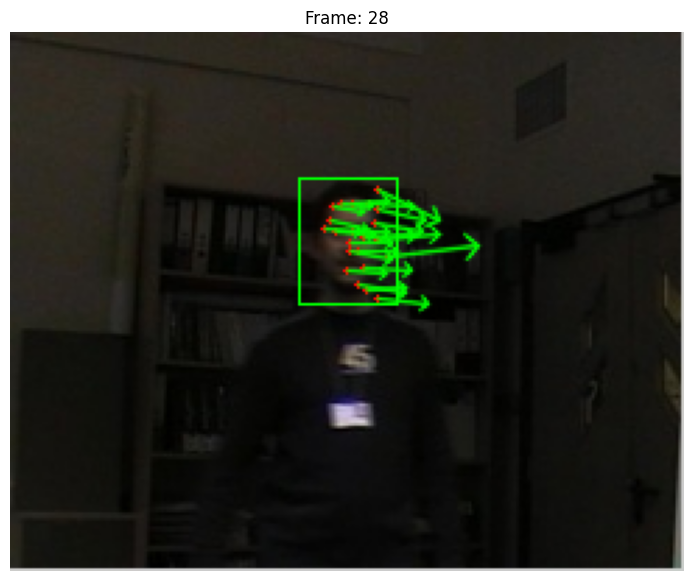

In [10]:
# Optical flow parameters
winSize = 9
numIter = 7
levelNum = 3
levelScale = 2
errThr = 0.1
# Initial box position
faceStart = np.array([65, 45])
faceShape = np.array([35, 45])
faceEnd = (faceStart[0] + faceShape[0], faceStart[1] + faceShape[1])
# Video recording objects
shape = cv2.imread(pathsMan[0], cv2.IMREAD_GRAYSCALE).shape[::-1]
videoRect = cv2.VideoWriter("man_track.mp4", 0, 12, shape)
videoRectValid = cv2.VideoWriter("man_track_valid.mp4", 0, 12, shape)
videoRectValidFlow = cv2.VideoWriter("man_track_valid_flow.mp4", 0, 12, shape)

for currentPath, nextPath in zip(pathsMan[:-1], pathsMan[1:]):
    # Initialization of frames
    currentFrame = int(os.path.basename(currentPath).split(".")[-2])
    manImg1 = cv2.imread(currentPath, cv2.IMREAD_GRAYSCALE)
    manImg2 = cv2.imread(nextPath, cv2.IMREAD_GRAYSCALE)
    faceStartInt = np.round(faceStart).astype(np.int64)
    faceEndInt = np.round(faceEnd).astype(np.int64)
    # Refresh keypoints
    if (currentFrame - 1) % 20 == 0:
        manImg1Cropped = manImg1[
            faceStartInt[1] : faceEndInt[1], faceStartInt[0] : faceEndInt[0]
        ]
        keypoints = cv2.goodFeaturesToTrack(
            manImg1Cropped,
            maxCorners=manImg1Cropped.size,
            qualityLevel=0.1,
            minDistance=3,
        )
        keypoints = np.squeeze(keypoints + faceStart).astype(np.int64)
    # Optical flow
    flowVectors, validPoints = pyrLucasKanade(
        manImg1, manImg2, keypoints, winSize, numIter, levelNum, levelScale, errThr
    )
    # Draw box, keypoints and optical flow
    imgRGB = cv2.cvtColor(
        cv2.imread(currentPath, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB
    )
    imgRGB = cv2.rectangle(imgRGB, faceStartInt, faceEndInt, (0, 255, 0), 1)
    videoRect.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    imgRGB = drawKeypoints(imgRGB, keypoints, size=1)
    videoRectValid.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    imgRGB = drawVectorFlow(imgRGB, keypoints, flowVectors, size=1, scaleFactor=3)
    videoRectValidFlow.write(cv2.cvtColor(imgRGB, cv2.COLOR_RGB2BGR))
    if currentFrame == 28:
        plt.figure()
        plt.imshow(imgRGB)
        plt.axis('off')
        plt.title(f'Frame: {currentFrame}')
    # Iteratively remove keypoints out of scope and average valid movement for the updated position
    changeFlag = True
    while changeFlag:
        faceStartCandidate = faceStart + np.mean(flowVectors[validPoints], axis=0)
        faceEndCandidate = faceStartCandidate + faceShape
        changeFlag = False
        for i, (x, y) in enumerate(keypoints):
            if (
                x < faceStartCandidate[0]
                or x > faceEndCandidate[0]
                or y < faceStartCandidate[1]
                or y > faceEndCandidate[1]
            ):
                if validPoints[i]:
                    validPoints[i] = False
                    changeFlag = True
    # Update box position and valid keypoints
    faceStart = faceStartCandidate
    faceEnd = faceEndCandidate
    keypoints = np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(
        np.int64
    )
# Save videos
cv2.destroyAllWindows()
videoRect.release()
videoRectValid.release()
videoRectValidFlow.release()

Na sačuvanim snimcima može se videti da je zadatak uspešno rešen i da je lice pravilno ispraćeno. 

## Bonus zadatak
U zadatku se traži da se reši problem optičke stabilizacije video snimka. Kao primer iskorišćen je Youtube snimak "road.mp4" vozila na autoputu, gde se kamera značajno trese. Ideja rešavanja jeste da se primeni slična procedura kao u prethodnim zadacima. Traže se ključne tačke na određenom broju frejmova kao početne tačke estimacije optičkog toga. Ovde se pokazalo da, zbog jakih pokreta, je neophodno da se ključne tačke traže na svakih deset frejmova. Zatim, primenjuje se piramidalni LK algoritam. Od svih validnih pomeraja, traži se medijalan pomeraj, da što više suzbije "outlier" pomeraje. Kada se radi stabilizacija video snimka, pretpostavka je da je prvi frejm korektno postavljen i od tog trenutka se sumiraju svi pomeraji (globalni pomeraj) i u svakom narednom frejmu, dati frejm se pomera u suprotnom smeru od tog globalnog pomeraja. Iskorišćene su za piramidalni LK algoritam vrednosti parametara winSize 5, numIter 7, numLevel 5, levelScale 2 i errThr 0.005. Ključna stvar je bila da se poveća broj nivoa piramide zbog veličine slike i količine pomeraja. Radi smanjenja utiska preostalog tresenja, čuva se istorija globalnih položaja i pre same translacije datog frejma uzima se prosek od poslednja dva globalna položaja. 

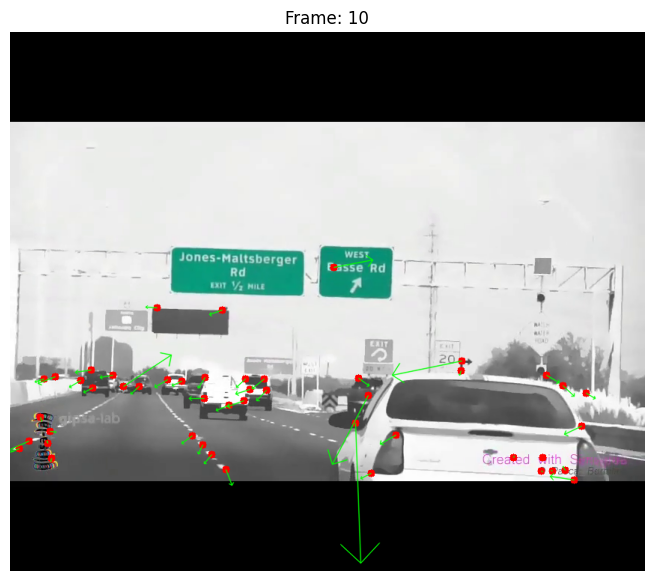

In [11]:
# Optical flow parameters
winSize = 5
numIter = 7
levelNum = 5
levelScale = 2
errThr = 0.005

cap = cv2.VideoCapture('road.mp4')
ret, roadImg1BGR = cap.read()
roadImg1 = cv2.cvtColor(roadImg1BGR, cv2.COLOR_BGR2GRAY)
roadImg1RGB = cv2.cvtColor(roadImg1BGR, cv2.COLOR_BGR2RGB)
shape = roadImg1.shape[::-1]
stable = cv2.VideoWriter("road_stable.mp4", 0, 25, shape)
currentFrame = 0
referencePositions = [(0,0)]
currentPosition  = 0
# Read until video is completed
while(cap.isOpened()):
    # Initialization of frames
    ret, roadImg2BGR = cap.read()
    if ret:
        roadImg2 = cv2.cvtColor(roadImg2BGR, cv2.COLOR_BGR2GRAY)
        roadImg2RGB = cv2.cvtColor(roadImg2BGR, cv2.COLOR_BGR2RGB)
        # Refresh keypoints
        if currentFrame % 10 == 0:
            keypoints = cv2.goodFeaturesToTrack(
                roadImg1,
                maxCorners=roadImg1.size,
                qualityLevel=0.3,
                minDistance=15,
            ).reshape(-1,2)
        # Optical flow
        flowVectors, validPoints = pyrLucasKanade(
            roadImg1, roadImg2, keypoints, winSize, numIter, levelNum, levelScale, errThr
        )
        
        keypoints = np.round(keypoints[validPoints] + flowVectors[validPoints]).astype(
            np.int64
        )
        flowVectors = flowVectors[validPoints]
        referencePositions.append(referencePositions[-1] + np.median(flowVectors,axis=0))
        referencePositions = referencePositions[-2:]
        currentPosition = np.mean(referencePositions,axis=0)
        # Transformation matrix
        M = np.array([[1,0, -currentPosition[0]],[0,1, -currentPosition[1]]])
        # Draw box, keypoints and optical flow
        roadImg1RGBAnnotate = drawKeypoints(roadImg1RGB, keypoints, size=5)
        roadImg1RGBAnnotate = drawVectorFlow(roadImg1RGBAnnotate, keypoints, flowVectors, size=1, scaleFactor=10)
        if currentFrame == 10:
            plt.figure()
            plt.imshow(roadImg1RGBAnnotate)
            plt.axis('off')
            plt.title(f'Frame: {currentFrame}')
            
        # Warp image
        roadImg1RGB = cv2.warpAffine(roadImg1RGB, M, shape)
        stable.write(cv2.cvtColor(roadImg1RGB, cv2.COLOR_RGB2BGR))

        roadImg1 = roadImg2
        roadImg1RGB = roadImg2RGB
        currentFrame += 1
    else:
        break
 
# When everything done, release the video capture object
cap.release()
 
# Save video
cv2.destroyAllWindows()
stable.release()

Kada se pogleda video snimak "road_stable.mp4", može se videti da postoji stabilizacija u odnosu na grube pomeraje, ali i dalje postoje sitne oscilacije, zbog same nepreciznosti implementacije algoritma i težine rešavanja problema. 